In [1]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
import matplotlib.pylab as plt
import tensorflow as tf
import numpy as np
import cv2
import os

In [2]:
img=image.load_img(r'C:\Users\subra\OneDrive\Desktop\CNN-HAPPY OR SAD\training\happy\1679905695525.jpg')

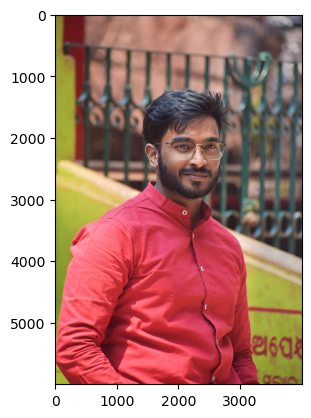

In [3]:
plt.imshow(img)

In [4]:
i1= cv2.imread(r'C:\Users\subra\OneDrive\Desktop\CNN-HAPPY OR SAD\training\happy\1679905695525.jpg')
i1

array([[[ 38, 114, 126],
        [ 40, 116, 128],
        [ 41, 117, 129],
        ...,
        [131, 117, 118],
        [130, 116, 117],
        [129, 115, 116]],

       [[ 37, 113, 125],
        [ 38, 114, 126],
        [ 40, 116, 128],
        ...,
        [130, 116, 117],
        [129, 115, 116],
        [128, 114, 115]],

       [[ 36, 112, 124],
        [ 37, 113, 125],
        [ 39, 115, 127],
        ...,
        [130, 116, 117],
        [129, 115, 116],
        [128, 114, 115]],

       ...,

       [[ 57, 185, 173],
        [ 57, 185, 173],
        [ 57, 185, 173],
        ...,
        [ 40, 127, 117],
        [ 40, 127, 117],
        [ 39, 126, 116]],

       [[ 57, 185, 173],
        [ 57, 185, 173],
        [ 57, 185, 173],
        ...,
        [ 41, 128, 118],
        [ 39, 126, 116],
        [ 38, 125, 115]],

       [[ 57, 185, 173],
        [ 57, 185, 173],
        [ 57, 185, 173],
        ...,
        [ 41, 128, 118],
        [ 39, 126, 116],
        [ 38, 125, 115]]

In [5]:
i1.shape

(6000, 4000, 3)

In [6]:
train=ImageDataGenerator(rescale=1/255)
validation=ImageDataGenerator(rescale=1/255)

In [7]:
train_dataset=train.flow_from_directory(r'C:\Users\subra\OneDrive\Desktop\CNN-HAPPY OR SAD\training',
                                        target_size=(200,200),
                                        batch_size=3,
                                        class_mode='binary')
validation_dataset=validation.flow_from_directory(r'C:\Users\subra\OneDrive\Desktop\CNN-HAPPY OR SAD\validation',
                                                  target_size=(200,200),
                                                  batch_size=3,
                                                  class_mode='binary')

Found 15 images belonging to 2 classes.
Found 0 images belonging to 2 classes.


In [8]:
 train_dataset.class_indices

{'happy': 0, 'not happy': 1}

In [9]:
train_dataset.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1])

In [10]:
validation_dataset.classes

array([], dtype=int32)

In [11]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(200, 200, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 198, 198, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 99, 99, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 97, 97, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 48, 48, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 46, 46, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 23, 23, 64)        0

In [12]:
model.compile(loss='binary_crossentropy',
              optimizer=tf.keras.optimizers.RMSprop(lr=0.001),
              metrics=['accuracy'])

In [13]:
model_fit=model.fit(train_dataset,
                   steps_per_epoch=3,
                   epochs=10,
                   validation_data=validation_dataset) 

Epoch 1/10
3/3 [==============================] - 6s 1s/step - loss: 1.2643 - accuracy: 0.4444
Epoch 2/10
3/3 [==============================] - 4s 1s/step - loss: 0.7222 - accuracy: 0.4444
Epoch 3/10
3/3 [==============================] - 4s 1s/step - loss: 0.8480 - accuracy: 0.7778
Epoch 4/10
3/3 [==============================] - 3s 1s/step - loss: 0.6308 - accuracy: 0.6667
Epoch 5/10
3/3 [==============================] - 5s 2s/step - loss: 0.4674 - accuracy: 0.8889
Epoch 6/10
3/3 [==============================] - 5s 2s/step - loss: 0.4438 - accuracy: 0.8889
Epoch 7/10
3/3 [==============================] - 5s 1s/step - loss: 0.1897 - accuracy: 1.0000
Epoch 8/10
3/3 [==============================] - 5s 1s/step - loss: 0.7433 - accuracy: 0.8889
Epoch 9/10
3/3 [==============================] - 5s 2s/step - loss: 0.5632 - accuracy: 0.6667
Epoch 10/10
3/3 [==============================] - 5s 2s/step - loss: 0.8499 - accuracy: 0.5556


In [14]:
dir_path = r'C:\Users\subra\OneDrive\Desktop\CNN-HAPPY OR SAD\testing'
for i in os.listdir(dir_path):
    print(i)

1665079192992.jpg
1679905695525.jpg
20220419_163709.jpg
20220423_122457.jpg
20220424_141745.jpg
20220710_200429.jpg
20220731_170501.jpg
20221018_195115.jpg
20221218_163725.jpg
20230406_153437.jpg
20230406_154239.jpg
20230406_155230.jpg
DSC_0007.JPG
IMG_20220906_110406_487.jpg
IMG_20230409_131203_224.jpg


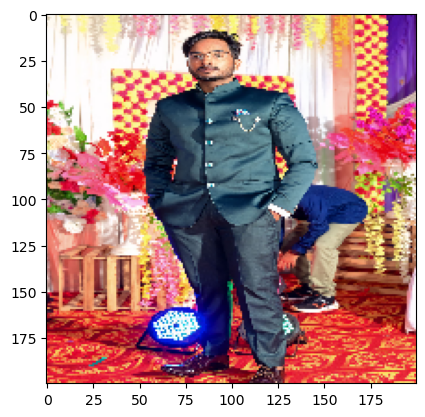

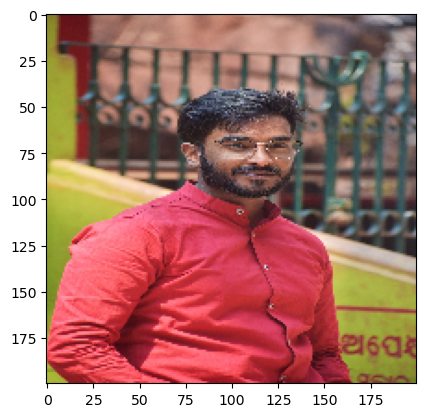

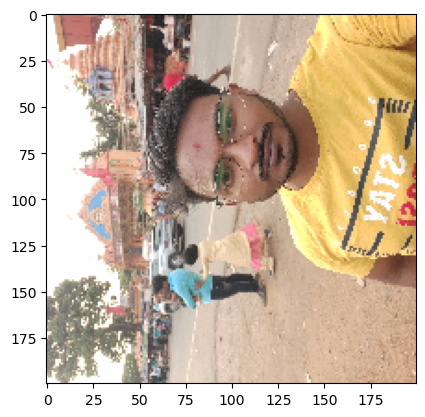

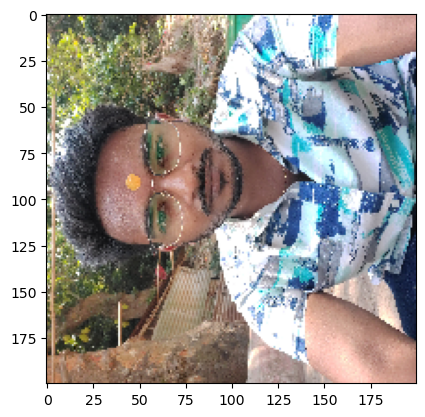

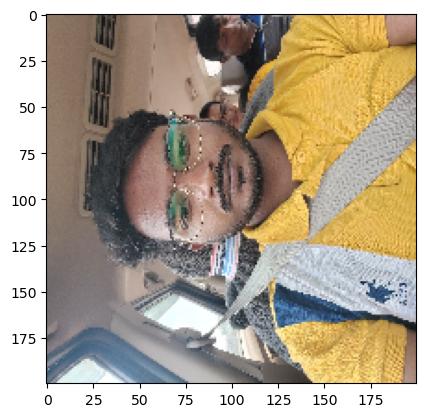

...

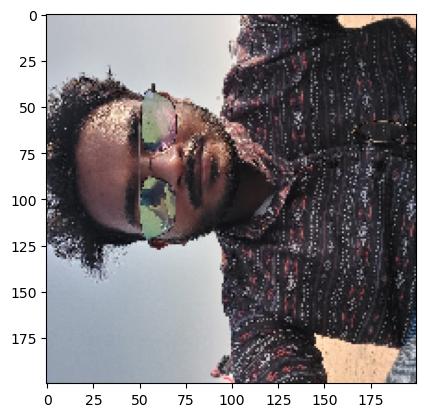

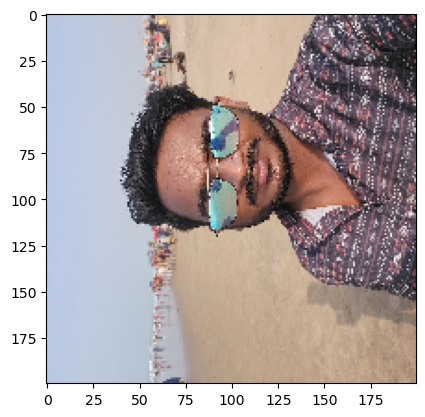

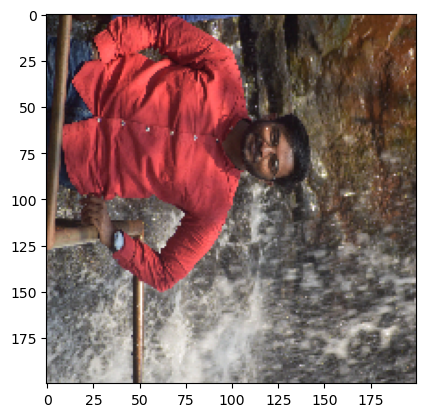

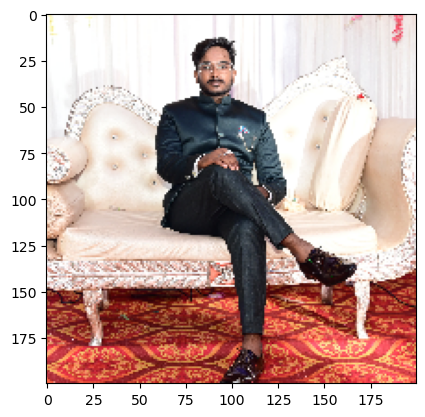

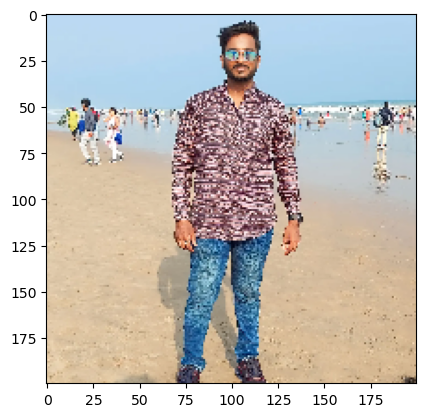

In [15]:
dir_path = r'C:\Users\subra\OneDrive\Desktop\CNN-HAPPY OR SAD\testing'
for i in os.listdir(dir_path):
    img = image.load_img(dir_path+ '//'+i, target_size = (200,200))
    plt.imshow(img)
    plt.show()

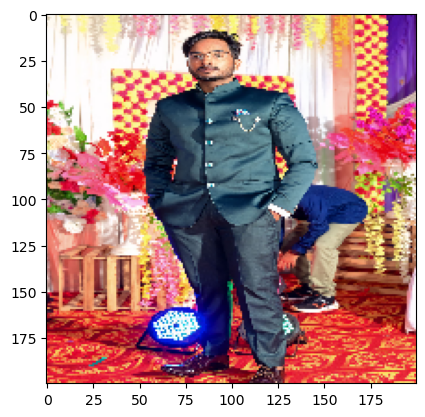

1/1 [==============================] - 0s 219ms/step
 i am happy


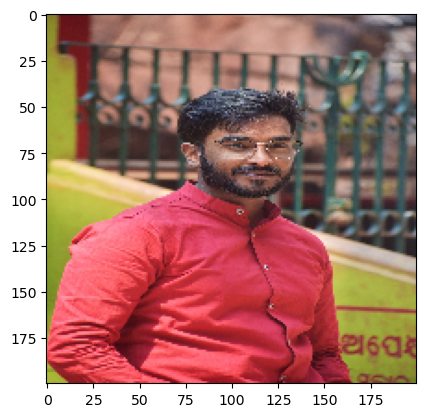

1/1 [==============================] - 0s 48ms/step
 i am happy


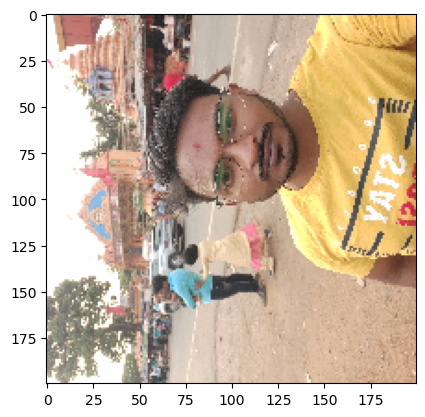

1/1 [==============================] - 0s 47ms/step
i am not happy


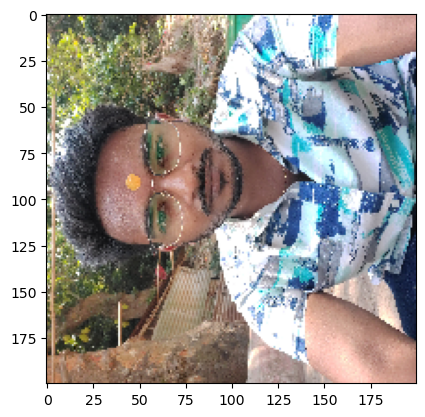

1/1 [==============================] - 0s 70ms/step
 i am happy


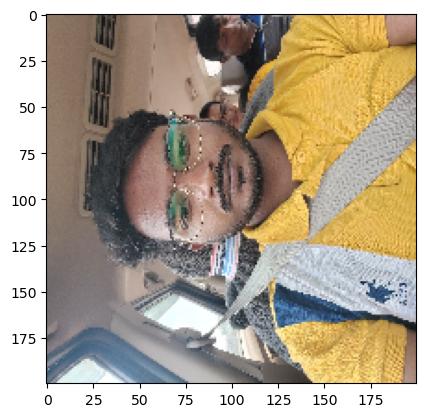

1/1 [==============================] - 0s 81ms/step
i am not happy


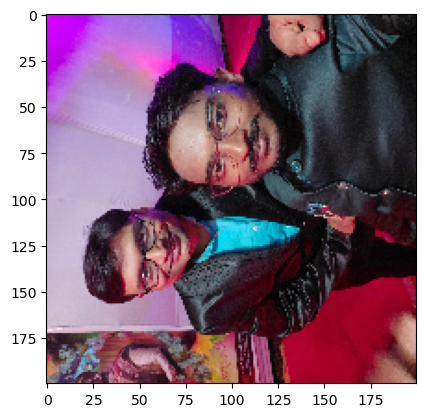

1/1 [==============================] - 0s 56ms/step
 i am happy


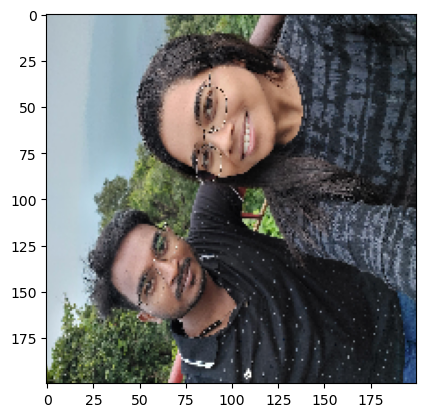

1/1 [==============================] - 0s 68ms/step
 i am happy


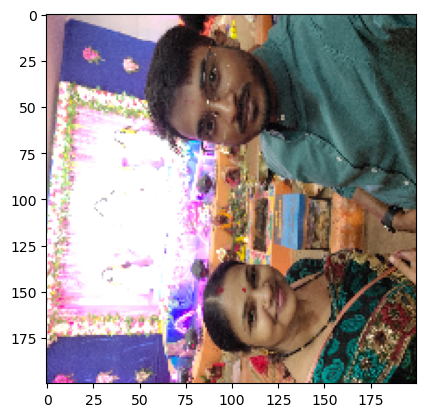

1/1 [==============================] - 0s 61ms/step
 i am happy


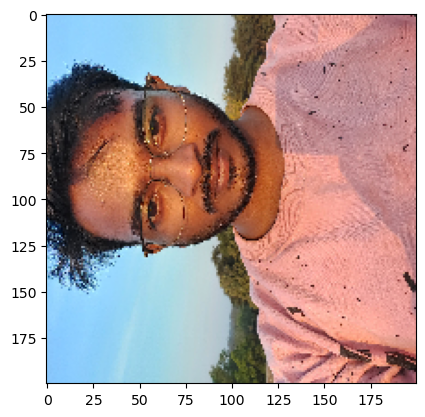

1/1 [==============================] - 0s 69ms/step
 i am happy


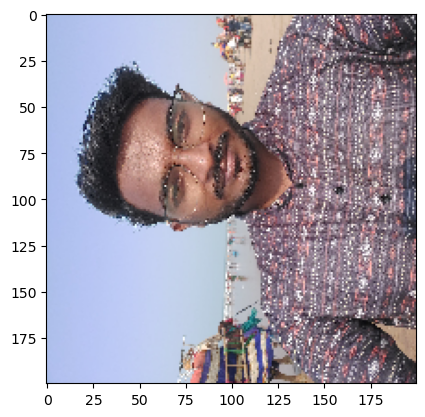

1/1 [==============================] - 0s 85ms/step
 i am happy


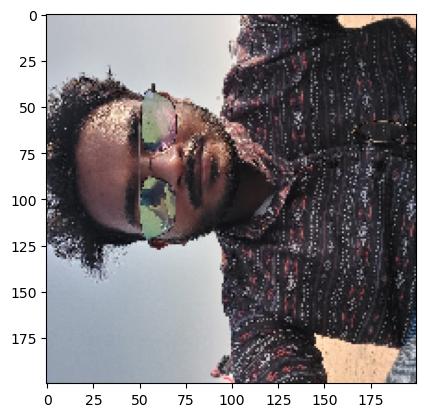

1/1 [==============================] - 0s 52ms/step
i am not happy


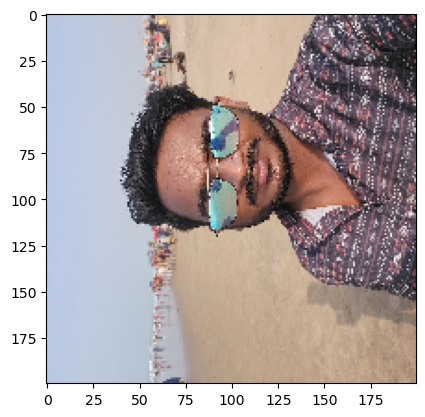

1/1 [==============================] - 0s 66ms/step
 i am happy


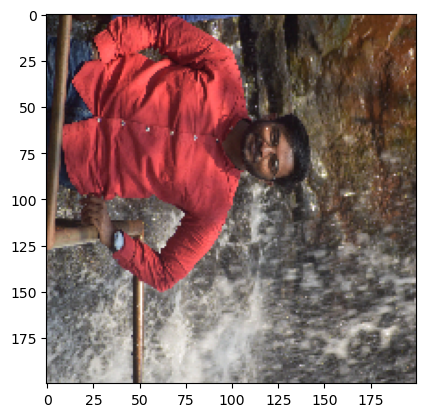

1/1 [==============================] - 0s 54ms/step
 i am happy


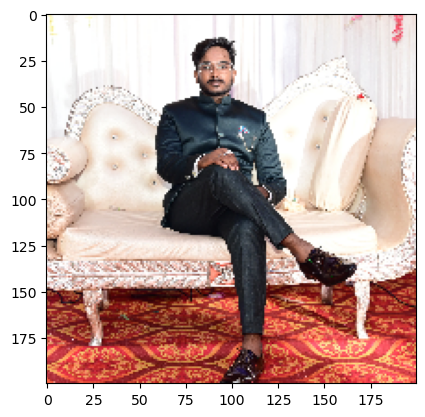

1/1 [==============================] - 0s 64ms/step
 i am happy


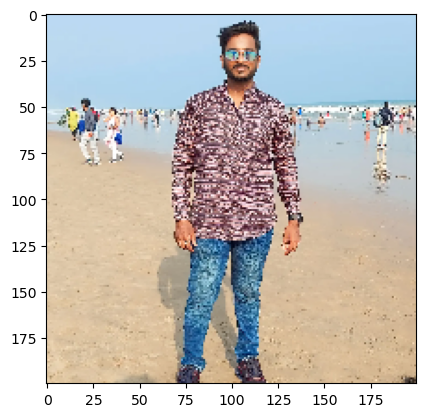

1/1 [==============================] - 0s 47ms/step
 i am happy


In [16]:
dir_path = r'C:\Users\subra\OneDrive\Desktop\CNN-HAPPY OR SAD\testing'
for i in os.listdir(dir_path):
    img = image.load_img(dir_path+ '//'+i, target_size = (200,200))
    plt.imshow(img)
    plt.show()
    
    x=image.img_to_array(img)
    x=np.expand_dims(x,axis = 0)
    images = np.vstack([x])
    
    val=model.predict(images)
    if val ==0:
        print( ' i am happy')
    else:
        print( 'i am not happy')

1/1 [==============================] - 0s 55ms/step


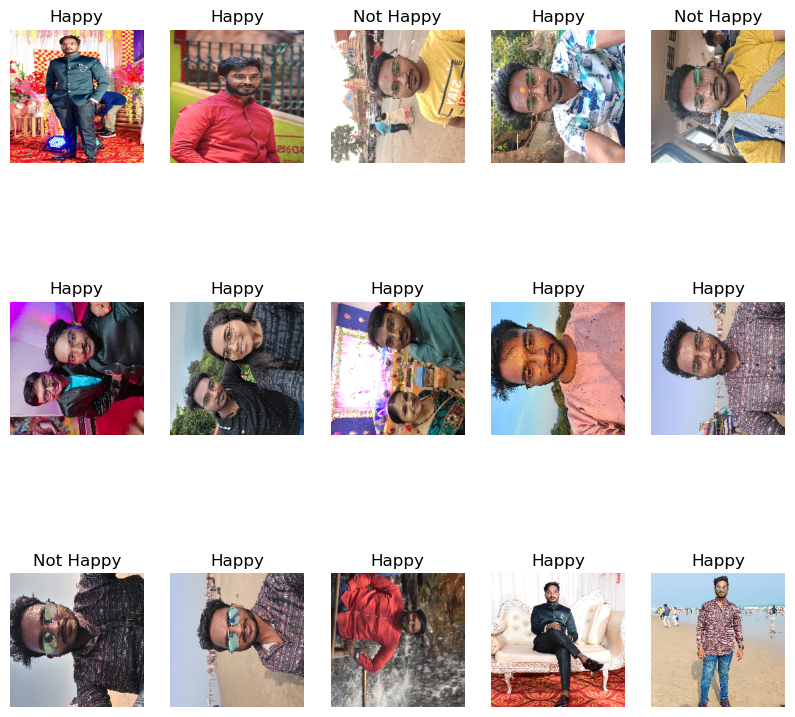

In [21]:
import os
import numpy as np
from keras.preprocessing import image
import matplotlib.pyplot as plt

# Define the directory path where your images are stored
dir_path = r"C:\Users\subra\OneDrive\Desktop\CNN-HAPPY OR SAD\testing"

# Create a list of image paths
image_paths = [os.path.join(dir_path, i) for i in os.listdir(dir_path)]

# Define the number of rows and columns for the grid
num_rows = 3
num_cols = 5

# Create a subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 10))

# Loop through the image paths and display them in the grid
for i, image_path in enumerate(image_paths):
    # Load and preprocess the image
    img = image.load_img(image_path, target_size=(200, 200))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)  # Corrected the axis parameter

    # Predict using your model (you need to define 'model' before this point)
    val = model.predict(x)

    if val == 0:  # Corrected the condition
        label = 'Happy'
    else:
        label = 'Not Happy'  # Corrected the label assignment

    # Calculate the position of the current image in the grid
    row = i // num_cols
    col = i % num_cols

    # Display the image and label in the corresponding grid cell
    axes[row, col].imshow(img)
    axes[row, col].set_title(label)
    axes[row, col].axis("off")

# Show the grid of images and labels
plt.show()
